In [1]:
import pandas as pd
from viz_utils import *
import numpy as np



In [2]:


df = pd.read_parquet("pbook.parquet")
df['event_id'] = np.arange(len(df), dtype=int)
df['shift_tradeside'] = df['TradeSide'].shift(1)
df


,arrival_timestamp,Source,StockId,SeqNo,EntryType,OrderbookStateCode,OrderbookFlush,BidPrice0,BidSize0,BidOrders0,...,HighTradePrice,LowTradePrice,AverageTradePrice,LastTradedVolume,AverageVolume,OnMarketVolume,OffMarketVolume,TstTradeCount,event_id,shift_tradeside
timestamp,,,,,,,,,,,,,,,,,,,,,
2025-01-12 04:01:21.982695,2025-01-12 08:31:03.816370010,tdwl,2222,13847,1,NaN,1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
2025-01-12 09:30:00.000005,2025-01-12 09:30:00.102878332,tdwl,2222,18259,1,4.0,0,27.95,462.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
2025-01-12 09:30:00.131449,2025-01-12 09:30:00.166012763,tdwl,2222,18629,1,4.0,0,27.95,482.0,9.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN
2025-01-12 09:30:00.137941,2025-01-12 09:30:00.166704893,tdwl,2222,18638,1,4.0,0,27.95,485.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
2025-01-12 09:30:00.146260,2025-01-12 09:30:00.169140577,tdwl,2222,18665,1,4.0,0,28.00,78.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-12 15:19:42.707004,2025-01-12 15:19:42.704854249,tdwl,2222,2528680,1,33.0,0,28.00,1394964.0,271.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31560,NaN
2025-01-12 15:19:44.592597,2025-01-12 15:19:44.590407133,tdwl,2222,2528721,1,33.0,0,28.00,1395164.0,272.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31561,NaN
2025-01-12 15:19:47.773931,2025-01-12 15:19:47.771745443,tdwl,2222,2528793,2,33.0,0,28.00,1395164.0,272.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31562,NaN


In [3]:
df[df.EntryType == 4]['shift_tradeside'].isna().sum()  # should be 0, since trades are always the same side as the previous row

np.int64(0)

In [4]:
df[df.EntryType == 1]

,arrival_timestamp,Source,StockId,SeqNo,EntryType,OrderbookStateCode,OrderbookFlush,BidPrice0,BidSize0,BidOrders0,...,HighTradePrice,LowTradePrice,AverageTradePrice,LastTradedVolume,AverageVolume,OnMarketVolume,OffMarketVolume,TstTradeCount,event_id,shift_tradeside
timestamp,,,,,,,,,,,,,,,,,,,,,
2025-01-12 04:01:21.982695,2025-01-12 08:31:03.816370010,tdwl,2222,13847,1,NaN,1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
2025-01-12 09:30:00.000005,2025-01-12 09:30:00.102878332,tdwl,2222,18259,1,4.0,0,27.95,462.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
2025-01-12 09:30:00.131449,2025-01-12 09:30:00.166012763,tdwl,2222,18629,1,4.0,0,27.95,482.0,9.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN
2025-01-12 09:30:00.137941,2025-01-12 09:30:00.166704893,tdwl,2222,18638,1,4.0,0,27.95,485.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
2025-01-12 09:30:00.146260,2025-01-12 09:30:00.169140577,tdwl,2222,18665,1,4.0,0,28.00,78.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-12 15:19:39.485383,2025-01-12 15:19:39.483141660,tdwl,2222,2528532,1,33.0,0,28.00,1394940.0,269.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31558,NaN
2025-01-12 15:19:41.447855,2025-01-12 15:19:41.445729732,tdwl,2222,2528615,1,33.0,0,28.00,1394960.0,270.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31559,NaN
2025-01-12 15:19:42.707004,2025-01-12 15:19:42.704854249,tdwl,2222,2528680,1,33.0,0,28.00,1394964.0,271.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31560,NaN


In [5]:
import ipywidgets as widgets # For the buttons.
from IPython.display import display
import viz_utils


def order_book(df: pd.DataFrame, startingEID=None, tradesN: int = 20):
    N = 1 # Number of snapshots to show at a time.
    STEP = N # Number of snapshot moved at a time.
    MAX_COLS = 3 # For orginization.

    # 1. Building the list of snapshots (event_ids).
    # This takes the event_id values for all rows where EntryType == 1, makes sure they’re ints, then turn them into a list.
    snapIDs = df.loc[df['EntryType'].eq(1), 'event_id'].astype(int).tolist()
    if not snapIDs:
        raise ValueError("No rows with EntryType == 1 found.")

    if startingEID is None:
        index = 1
    else:
        startingEID = int(startingEID) # Making sure it’s an int.
        try:
            index = snapIDs.index(startingEID) # This finds the position of the starting event_id inside snapIDs and stores it in index (exact match).
        except ValueError:
            # If there is no exact match, we pick the first snapshot whose id is >= startingEID.
            index = next((i for i, num in enumerate(snapIDs) if num >= startingEID), len(snapIDs) - 1)

    # 2. Creating UI state and widgets.
    output = widgets.Output()
    status = widgets.Label()

    previousButton = widgets.Button(description="<- Prev")
    nextButton = widgets.Button(description="Next ->")

    # This clears the output box, draws the figure for the current page (starting at snapIDs[index]) and updates the status and button states.
    def render():
        with output:
            output.clear_output(wait=True) # This clears the previous page before rendering the new one.
            startEventID = snapIDs[index]
            # figure = viz_utils_old.plot_order_book_table(df, event_id=startEventID, n=N, max_cols_per_row=MAX_COLS) # Without highlighting.
            figure = viz_utils.plot_order_book_table_highlighted_flags(df, event_id=startEventID, n=N, max_cols_per_row=MAX_COLS, changed_alpha=0.50) # With highligting.
            display(figure)

            mask = (df['event_id'].to_numpy() == startEventID)
            pos_arr = mask.nonzero()[0]
            if pos_arr.size:
                up_to_idx = int(pos_arr[0])
                figureTrades = viz_utils.plot_recent_trades_table(df, n=tradesN, up_to_index=up_to_idx, newest_first=True,)
                display(figureTrades)
            else:
                print("(No trades table: couldn't locate row for current event_id.)")



        # This update the status and button states.
        shownLO = index + 1
        shownHI = min(index + N, len(snapIDs))
        if N == 1:
            status.value = f"Showing snapshot {shownLO-1} of {len(snapIDs)} (event_id={snapIDs[index]})"
        else:
            status.value = f"Showing snapshots {shownLO-1}-{shownHI-1} of {len(snapIDs)} (start event_id={snapIDs[index]})"

        previousButton.disabled = (index == 0)
        nextButton.disabled = (index >= len(snapIDs) - 1)

    # 3. The button calls.
    def previous(_):
        nonlocal index
        index = max(0, index - STEP) # Moving left by STEP, but not less than 0.
        render()

    def next(_):
        nonlocal index
        index = min(len(snapIDs) - 1, index + STEP) # Moving right by STEP, but not more than the last index.
        render()

    previousButton.on_click(previous)
    nextButton.on_click(next)

    # This makes a horizontal row containing the previous button, next button, and the status label.
    controls = widgets.HBox([previousButton, nextButton, status])

    UI = widgets.VBox([controls, output])

    render()
    return UI



In [6]:
order_book(df, startingEID=2000, tradesN=10)

In [7]:
plot_order_book_table(df, event_id=2005)

In [8]:
df.columns.tolist()

['arrival_timestamp',
 'Source',
 'StockId',
 'SeqNo',
 'EntryType',
 'OrderbookStateCode',
 'OrderbookFlush',
 'BidPrice0',
 'BidSize0',
 'BidOrders0',
 'BidLevelPrevPrice0',
 'BidLevelPrevSize0',
 'BidLevelPrevOrders0',
 'BidSizeAdded0',
 'BidSizeRemoved0',
 'BidOrdersAdded0',
 'BidOrdersRemoved0',
 'AskPrice0',
 'AskSize0',
 'AskOrders0',
 'AskLevelPrevPrice0',
 'AskLevelPrevSize0',
 'AskLevelPrevOrders0',
 'AskSizeAdded0',
 'AskSizeRemoved0',
 'AskOrdersAdded0',
 'AskOrdersRemoved0',
 'EventType0',
 'BidPrice1',
 'BidSize1',
 'BidOrders1',
 'BidLevelPrevPrice1',
 'BidLevelPrevSize1',
 'BidLevelPrevOrders1',
 'BidSizeAdded1',
 'BidSizeRemoved1',
 'BidOrdersAdded1',
 'BidOrdersRemoved1',
 'AskPrice1',
 'AskSize1',
 'AskOrders1',
 'AskLevelPrevPrice1',
 'AskLevelPrevSize1',
 'AskLevelPrevOrders1',
 'AskSizeAdded1',
 'AskSizeRemoved1',
 'AskOrdersAdded1',
 'AskOrdersRemoved1',
 'EventType1',
 'BidPrice2',
 'BidSize2',
 'BidOrders2',
 'BidLevelPrevPrice2',
 'BidLevelPrevSize2',
 'BidLev

In [9]:
import pandas as pd
import plotly.graph_objects as go
from heatmap import orderbook_heatmap

# This loads the order book parquet file.
df = pd.read_parquet("pbook.parquet")

# This calls the heatmap function.
fig = orderbook_heatmap(df, levels=15, time_col="arrival_timestamp")

# This shows the heatmap.
fig.show()


In [10]:
df[df["EntryType"] == 1]

,arrival_timestamp,Source,StockId,SeqNo,EntryType,OrderbookStateCode,OrderbookFlush,BidPrice0,BidSize0,BidOrders0,...,FirstTradePrice,LastTradePrice,HighTradePrice,LowTradePrice,AverageTradePrice,LastTradedVolume,AverageVolume,OnMarketVolume,OffMarketVolume,TstTradeCount
timestamp,,,,,,,,,,,,,,,,,,,,,
2025-01-12 04:01:21.982695,2025-01-12 08:31:03.816370010,tdwl,2222,13847,1,NaN,1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 09:30:00.000005,2025-01-12 09:30:00.102878332,tdwl,2222,18259,1,4.0,0,27.95,462.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 09:30:00.131449,2025-01-12 09:30:00.166012763,tdwl,2222,18629,1,4.0,0,27.95,482.0,9.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 09:30:00.137941,2025-01-12 09:30:00.166704893,tdwl,2222,18638,1,4.0,0,27.95,485.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 09:30:00.146260,2025-01-12 09:30:00.169140577,tdwl,2222,18665,1,4.0,0,28.00,78.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-12 15:19:39.485383,2025-01-12 15:19:39.483141660,tdwl,2222,2528532,1,33.0,0,28.00,1394940.0,269.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 15:19:41.447855,2025-01-12 15:19:41.445729732,tdwl,2222,2528615,1,33.0,0,28.00,1394960.0,270.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-12 15:19:42.707004,2025-01-12 15:19:42.704854249,tdwl,2222,2528680,1,33.0,0,28.00,1394964.0,271.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
quotes = df[df["EntryType"] == 1].copy()

quotes = quotes.dropna(subset=["AskPrice0", "BidPrice0"])
quotes = quotes[(quotes["AskPrice0"] > 0) & (quotes["BidPrice0"] > 0)]

quotes['spread'] = quotes['AskPrice0'] - quotes['BidPrice0']

def get_tick_size(price):
    if price < 10:
        return 0.01
    elif price < 25.00:
        return 0.02
    elif price < 50.00:
        return 0.05
    elif price < 100.00:
        return 0.10
    else:
        return 0.20

quotes["mid_price"] = (quotes["AskPrice0"] + quotes["BidPrice0"]) / 2
quotes["tick_size"] = quotes["mid_price"].apply(get_tick_size)
quotes["spread_ticks"] = quotes["spread"] / quotes["tick_size"]

# ratio = quotes["spread"] / quotes["tick_size"]
# if not np.allclose(ratio, np.round(ratio)):
#     print("Some spreads don't align to tick grid — check tick size or clean data.")
# quotes["spread_ticks"] = np.round(ratio).astype(int)




In [12]:
import plotly.express as px

figure = px.line(
    quotes,
    x="arrival_timestamp",
    y="spread_ticks",
    title="Spread in Ticks Over Time"
)
figure.show()


In [13]:
# This checks that (AskPrice0 - BidPrice0) is always a multiple of tick size, and returns a DataFrame with violations.
def check_tick_consistency(df):
    # Keep only valid quote rows (EntryType = 1)
    quotes = df[df["EntryType"] == 1].copy()

    # Drop rows with NaN or 0 prices
    quotes = quotes[(quotes["AskPrice0"] > 0) & (quotes["BidPrice0"] > 0)]
    quotes = quotes.dropna(subset=["AskPrice0", "BidPrice0"])

    # Calculate spread
    quotes["spread"] = quotes["AskPrice0"] - quotes["BidPrice0"]

    # Mid price to determine tick size
    quotes["mid_price"] = (quotes["AskPrice0"] + quotes["BidPrice0"]) / 2

    # Assign tick size for each row
    quotes["tick_size"] = quotes["mid_price"].apply(get_tick_size)

    # Compute spread / tick_size
    ratio = quotes["spread"] / quotes["tick_size"]

    # Mark violations (ratios not close to integer)
    quotes["spread_ticks"] = ratio
    mask = ~np.isclose(ratio, np.round(ratio), atol=1e-9)

    # Return only violating rows
    bad_rows = quotes.loc[mask, ["arrival_timestamp", "AskPrice0", "BidPrice0", "spread", "tick_size", "spread_ticks"]]
    return bad_rows


In [14]:
bad = check_tick_consistency(df)
print(bad.head())

Empty DataFrame
Columns: [arrival_timestamp, AskPrice0, BidPrice0, spread, tick_size, spread_ticks]
Index: []


In [15]:
from viz_utils import plot_pbook_interactive

bbo_fig = plot_pbook_interactive(df, window=50)

bbo_fig


<Axes: xlabel='timestamp'>

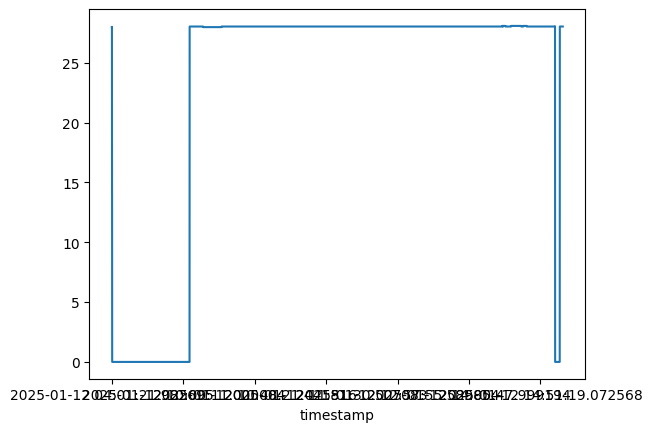

In [16]:
df["mid_price"] = (df["AskPrice0"] + df["BidPrice0"]) / 2
df["mid_price"].plot()
